# Scan analysis

In [1]:
%load_ext autoreload
%autoreload 2

%matplotlib widget

In [29]:
import pandas as pd

import seaborn as sns

import numpy as np
import matplotlib.pyplot as plt

import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.express as px

import copy

import optuna

from optuna.visualization import (
    plot_optimization_history,
    plot_contour,
)
from optuna.samplers import TPESampler

from plots2.fns import (
    standard_layout,
    corner_annotations_colwise,
    corner_annotations_rowwise,
    get_text_annotation
)

from poly2.utils import (
    get_dispersal_kernel, trait_vec, beta_dist,
    gamma_dist, find_beta_vectorised, score_for_this_df,
    get_dist_mean, get_dist_var
)
from poly2.run import no_joblib_single_run, no_joblib_multiple_run
from poly2.config import Config, ConfigMixture, get_asymptote_config
from poly2.simulator import SimulatorOneTrait, SimulatorAsymptote

In [64]:
optuna.logging.set_verbosity(0)

## Conclusions:

For low dose:
- high curvature good
- high b good
- think want high mu

Need to be careful that curvature not so high that it stays too flat initially, or that dose response looks silly 

Something like this looks decent:

```
cf = get_asymptote_config(
    verbose=False,
    n_k=100,
    n_years=30,              
    k_mu=0.96,
    k_b=2,
    curvature=20
)
```



Next steps:

- try fitting to Frank data (quickly)
- see what that model does, if crap then try custom parameters to demonstrate effect
- hope for something which fairly consistently gives high doses best
- probably show that range of outcomes possible again

In [79]:
class FungicideObjective:
    def __init__(self) -> None:
        """Fit fungicide distribution parameters

        Parameters
        ----------
        config : Config
            See Config docs - type 'single'
        """
        
        TRAIN_TEST_SPLIT_PROPORTION = 2/3

        self.df = (
            pd.read_csv(
                '../data/control_prothio_with_uncertainty.csv'
            )
            .loc[lambda df: (
                df.year <= (
                    df.year.min() - 1
                    + TRAIN_TEST_SPLIT_PROPORTION *
                    (1 + df.year.max() - df.year.min())
                )
            )
            ]
            .rename(columns={
                'control_with_noise_t': 'data_control',
            })
        )

        n_years = len(self.df.year.unique())

        input_severities = [0.37] * n_years

        self.input_severities = input_severities
        
        cf = get_asymptote_config(
            verbose=False,
            n_k=300,
            n_years=n_years,
            k_mu=None,
            k_b=None,
            curvature=None
        )
        
        cf.betas = find_beta_vectorised(input_severities, cf.I0s[0])
        
        cf.print_repr()

        self.config = cf

    #
    #

    def __call__(self, trial):

        params = self.get_params(trial)

        control = self.run_model(params)

        return score_for_this_df(self.df, control)

    #
    #

    def run_model(self, params):

        NOT_USED_NUM = 0.5

        sevs_trait_off = np.asarray(self.input_severities)

        conf_use = copy.deepcopy(self.config)
        conf_use.k_mu = params['mu']
        conf_use.k_b = params['b']
        conf_use.curvature = params['curvature']

        output = (
            SimulatorAsymptote(conf_use, number_of_sprays=1)
            .run_model()
        )

        sevs_trait_on = np.asarray(output['dis_sev'])

        control = 100 * (1 - sevs_trait_on / sevs_trait_off)

        return control

    #
    #

    def get_params(self, trial):
        params = {
            "mu": trial.suggest_float("mu", 1e-2, 1),
            "b": trial.suggest_float("b", 1e-3, 30),
            "curvature": trial.suggest_float("curvature", 1e-2, 30),
        }
        return params

In [80]:
sampler = TPESampler(seed=0)
study = optuna.create_study(sampler=sampler)
obj_f = FungicideObjective()

CONFIG
------
I0s = [0.00985703, 0.00985703, 0.00985703, 0.00985 ...
asymptote = None
betas = [0.00877344, 0.00877344, 0.00877344, 0.008 ...
curvature = None
decay_rate = None
doses = [1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1 ...
fungicide_mixture = False
k_b = None
k_mu = None
mutation_proportion = 1.234375e-05
mutation_scale_fung = 0.0019836158401698102
n_k = 300
n_years = 12
sprays = None



In [106]:
%%time

study.optimize(obj_f, n_trials=20)
int(study.best_value)

Wall time: 1min 53s


738665

In [107]:
%%time

study.optimize(obj_f, n_trials=20)
int(study.best_value)

Wall time: 1min 45s


710641

In [108]:
%%time

study.optimize(obj_f, n_trials=100)
int(study.best_value)

Wall time: 8min 53s


692231

# Plot opt

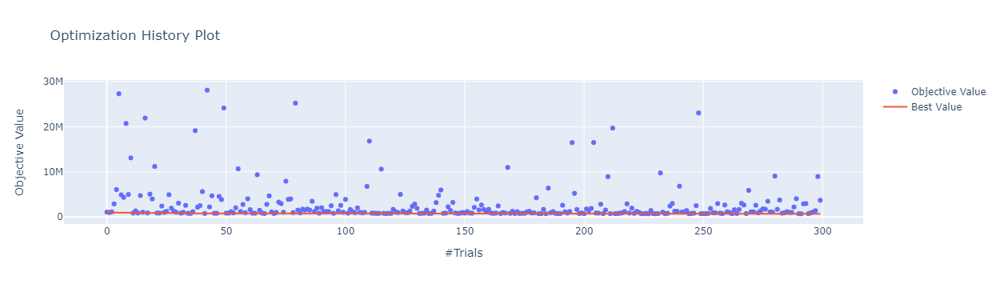

In [109]:
plot_optimization_history(study)

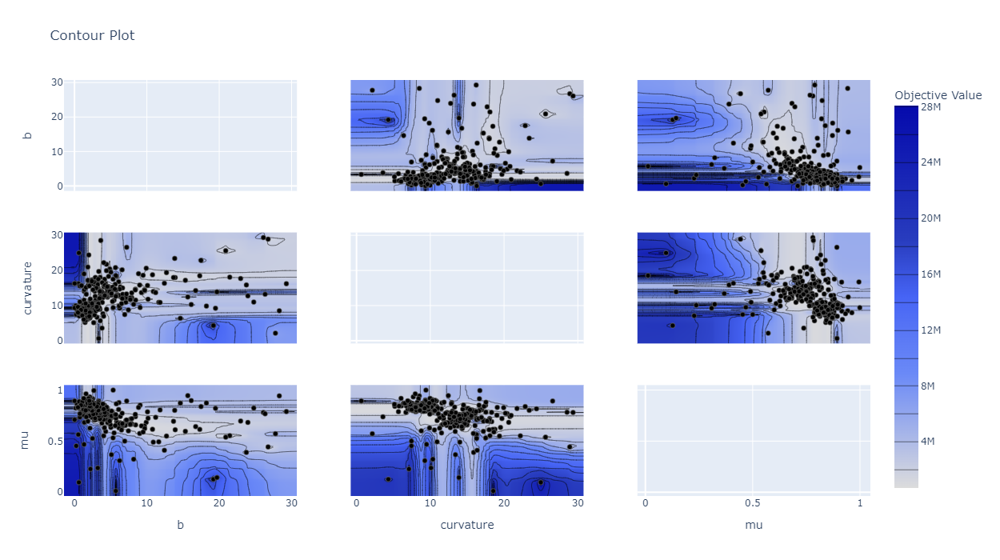

In [110]:
fig = plot_contour(study)

fig.update_layout(height=700)

# Plot output

In [111]:
best_pars = study.best_params
best_pars

{'mu': 0.8580170221273883,
 'b': 1.7004272221282069,
 'curvature': 8.38197311949124}

In [114]:
out = obj_f.run_model(best_pars)

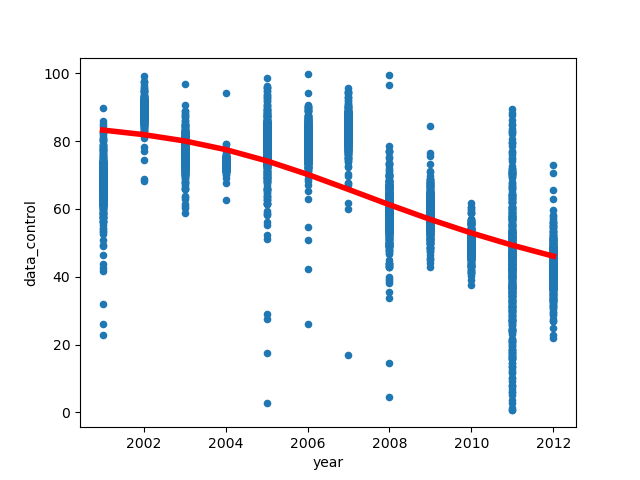

In [115]:
f, ax = plt.subplots()

obj_f.df.plot.scatter(x='year', y='data_control', ax=ax)

ax.plot(obj_f.df.year.unique(), out, c='r', lw=4)

In [149]:
Config()

CONFIG
------
I0s = [0.00985703, 0.00985703, 0.00985703, 0.00985 ...
asymptote = None
betas = [0.00786542, 0.00786542, 0.00786542, 0.007 ...
decay_rate = None
doses = [1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1 ...
fungicide_mixture = False
host_on = None
k_b = 0.8431572316700577
k_mu = 9.44286788381916
l_b = 6.585357214619326
l_mu = 0.8089358816813786
mutation_proportion = 1.234375e-05
mutation_scale_fung = 0.0019836158401698102
mutation_scale_host = 0.0019836158401698102
n_k = 50
n_l = 50
n_years = 15
replace_cultivars = None
sprays = None



In [179]:
b = 100
mu = 5
a = mu*b

init_dist = gamma_dist(300, a, b)

var = a/b**2

mu, var

(5, 0.05)

In [188]:
tv = trait_vec(300)

In [189]:
init_dist = gamma_dist(300, mu*bb, bb)

reshaped = init_dist.reshape((300, 1))

get_dist_mean(reshaped, tv), get_dist_var(reshaped, tv)

(array([0.14416524]), array([0.0512813]))

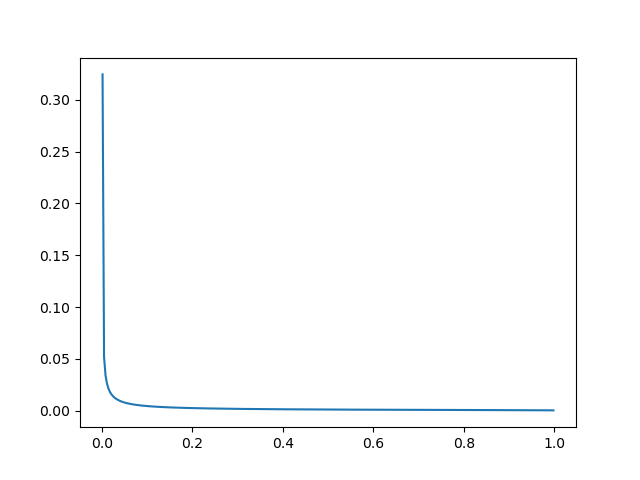

In [190]:
f, ax = plt.subplots()

ax.plot(tv, init_dist)

In [242]:
from poly2.utils import edge_values

In [266]:
ev = edge_values(10)

keys = [(
    f'in_{ev[ii]:.1f}_{ev[ii+1]:.1f}'
    .replace('.', 'p')
    )
    for ii in range(len(ev)-1)
]
                                             
keys

['in_0p0_0p1',
 'in_0p1_0p2',
 'in_0p2_0p3',
 'in_0p3_0p4',
 'in_0p4_0p5',
 'in_0p5_0p6',
 'in_0p6_0p7',
 'in_0p7_0p8',
 'in_0p8_0p9',
 'in_0p9_1p0']

In [269]:
{keys[ii]: xx[ii] for ii in range(10)}

{'in_0p0_0p1': 0.6604115594773059,
 'in_0p1_0p2': 0.09681955506782472,
 'in_0p2_0p3': 0.06098482368593858,
 'in_0p3_0p4': 0.04478856574389495,
 'in_0p4_0p5': 0.0352460681298456,
 'in_0p5_0p6': 0.02879090243252097,
 'in_0p6_0p7': 0.023991807950462442,
 'in_0p7_0p8': 0.02011324304475662,
 'in_0p8_0p9': 0.016620294237404094,
 'in_0p9_1p0': 0.012233180230046187}

In [277]:
data = pd.DataFrame({keys[ii]: xx[ii] for ii in range(10)}, index=np.arange(len(df1)))

In [284]:
df1.shape

(3, 1)

In [280]:
df1 = pd.DataFrame(dict(x=[12,122,123]))

In [281]:
df1.join(data)

,x,in_0p0_0p1,in_0p1_0p2,in_0p2_0p3,in_0p3_0p4,in_0p4_0p5,in_0p5_0p6,in_0p6_0p7,in_0p7_0p8,in_0p8_0p9,in_0p9_1p0
0,12,0.660412,0.09682,0.060985,0.044789,0.035246,0.028791,0.023992,0.020113,0.01662,0.012233
1,122,0.660412,0.09682,0.060985,0.044789,0.035246,0.028791,0.023992,0.020113,0.01662,0.012233
2,123,0.660412,0.09682,0.060985,0.044789,0.035246,0.028791,0.023992,0.020113,0.01662,0.012233


In [245]:
xx = gamma_dist(10, mu*bb, bb)

In [246]:
xx

array([0.66041156, 0.09681956, 0.06098482, 0.04478857, 0.03524607,
       0.0287909 , 0.02399181, 0.02011324, 0.01662029, 0.01223318])

<AxesSubplot:>

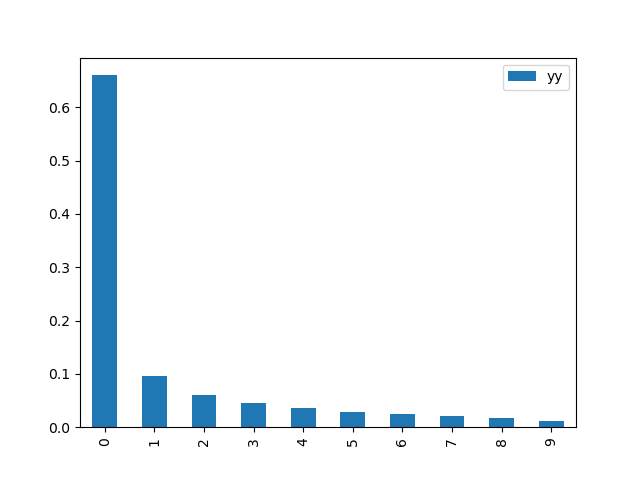

In [240]:
pd.DataFrame(dict(yy= xx)).plot.bar()

In [210]:
xx[:2].sum()

0.7572311145451306

In [211]:
dd = dict(
    sum_0=init_dist[:1].sum(),
    sum_1=init_dist[:2].sum(),
    sum_5=init_dist[:6].sum(),
    sum_10=init_dist[:11].sum(),
    sum_50=init_dist[:51].sum(),
    sum_100=init_dist[:101].sum(),
)

In [212]:
dd

{'sum_0': 0.3245824542492321,
 'sum_1': 0.37636596071899747,
 'sum_5': 0.47456513015023855,
 'sum_10': 0.5383063082317863,
 'sum_50': 0.7336432712258123,
 'sum_100': 0.83604513885455}

In [233]:
dd = {
    0: 0,
    1: init_dist[:1].sum(),
    2: init_dist[:2].sum(),
    5: init_dist[:5].sum(),
    10: init_dist[:10].sum(),
    50: init_dist[:50].sum(),
    100: init_dist[:100].sum(),
    150: init_dist[:150].sum(),
    200: init_dist[:200].sum(),
    250: init_dist[:250].sum(),
    290: init_dist[:290].sum(),
    300: 1
}

(-0.05, 1.05)

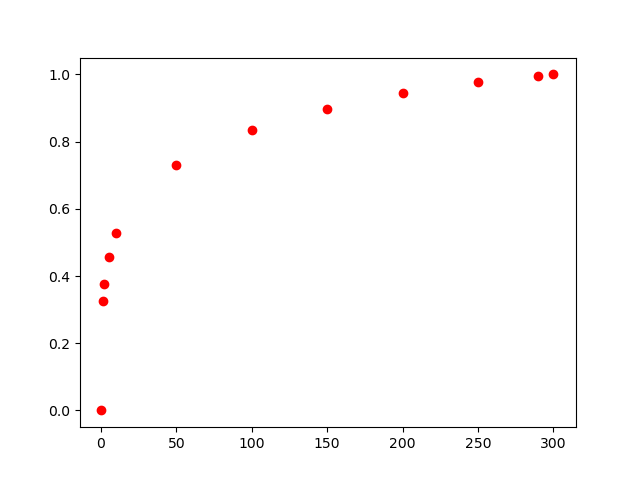

In [234]:
f, ax = plt.subplots()

for key, item in dd.items():
    ax.scatter(key, item, c='r')
    
ax.set_ylim([-0.05, 1.05])